In [37]:
# Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt

# Data Processing
import numpy as np
import pandas as pd
import pickle
from gensim.models import Word2Vec

# NLP 
import re
import gensim
import nltk
import spacy
from nltk.corpus import stopwords
nltk.download('wordnet')

# ML
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix

# BERT
import torch
from pytorch_pretrained_bert import BertTokenizer, BertModel, BertForMaskedLM
from scipy.spatial.distance import cosine

import warnings

[nltk_data] Downloading package wordnet to /Users/kaushik-
[nltk_data]     shakkari/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [42]:
df = pd.read_csv('/Users/kaushik-shakkari/Downloads/counsel_chat_dataset.csv')

In [43]:
df.dropna(inplace = True)

In [45]:
df.topic.nunique()

31

In [29]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

df.sample(5)

,questionID,questionTitle,questionText,questionLink,topic,therapistInfo,therapistURL,answerText,upvotes,views,split
541,198,I am paranoid that my boyfriend hiding something from me,"My boyfriend and I have been dating for almost a year. We go to different schools, and we don't see each other that often. I just feel very paranoid that there's someone else or that he could be hiding something from me.",https://counselchat.com/questions/i-am-paranoid-that-my-boyfriend-hiding-something-from-me,anxiety,Traci LowenthalLGBTQAffirmative Therapist,https://counselchat.com/therapists/traci-lowenthal-2,"Have you spoken to him about your fears? Perhaps you can explain this feeling to him and let him know what might lead to feeling more secure. Also, it is important to trust your intuition! Perhaps there are good reasons to feel concerned. It may not be paranoia - it may be based in reality!",1,196,val
1059,416,I'm just not happy with my marriage,"He is verbally abusive. When he gets mad, he just yells at me. At times, I feel scared.",https://counselchat.com/questions/i-m-just-not-happy-with-my-marriage,domestic-violence,"Sherry Katz, LCSWCouples and Family Therapist, LCSW",https://counselchat.com/therapists/sherry-katz-lcsw,"Good for you on recognizing your own feelings. Often in an abusive relationship, the person who is being abused, starts doubting themselves and starts tolerating, then accepting abuse.Marriage is based in love and feeling taken care of by the partner. Feeling scared is the opposite of this.If you feel ready, tell him the way you feel and pay attention to how willing your husband is to being aware that he yells and that you feel scared.If he has no idea of what you're talking about, doesn't want to understand what you feel, then slowly take steps to understand within yourself whether or not tolerating your husband's behavior is acceptable to live with on an everyday basis.",1,299,train
1058,416,I'm just not happy with my marriage,"He is verbally abusive. When he gets mad, he just yells at me. At times, I feel scared.",https://counselchat.com/questions/i-m-just-not-happy-with-my-marriage,domestic-violence,"Katrina Whitehead MA, LPCCTo provide hope and healing to individuals",https://counselchat.com/therapists/katrina-whitehead-ma-lpcc,I’m sorry you are experiencing this and I’m glad that you are looking for help and support. I’m not sure of all the details so take from answer what you can. If you are feeling unsafe or scared in your relationship please know that there are non profit domestic violence services that can help and provide you some more support. They can also safely plan with you if you choose to leave. It seems that you might be feeling defeated and if that’s the case a lot of domestic violence non profits provide free counseling if you are needing to talk to someone. What you are going through can be overwhelming and your are taking the right steps toward healing,1,370,train
99,9,Why does it feel as if self-harm is an addiction?,"I self-harm, and I stop for awhile. Then when I see something sad or depressing, I automatically want to self-harm.",https://counselchat.com/questions/why-does-it-feel-as-if-self-harm-is-an-addiction,depression,"Todd Schmenk, M.S., M.Ed.AQAL Therapies, Inc.,",https://counselchat.com/therapists/todd-schmenk-m-s-m-ed,"In a way, self-harm can present somewhat like an addiction. According to new research within the field of neuroscience there is a valid explanation for this. When a person cuts or uses other forms of self harm, the body produces endorphins to help make a person feel better. If a person was dealing with depression or high anxiety, that might be misinterpreted by the brain as a way to help oneself feel better and a new neural network or map might form (addiction) that would utilize this new behavior. Another way to look at it would be thru a behavioral lens, a positive reward for a behavior, even though the behavior has other long term negative consequences. Consider work

In [30]:
df = df.drop_duplicates(subset='questionTitle', keep="first")
df = df.reset_index()
df = df.drop("index", axis = 1)

In [51]:
df.groupby(['questionTitle']).topic.value_counts()

questionTitle                                                                                                                               topic                   
A friend of my child's father is sending him inappropriate content                                                                          workplace-relationships     4 
About a year ago I found out my husband had cheated on me                                                                                   marriage                    4 
All I can do is cry and hate myself                                                                                                         self-esteem                 1 
Am I a lesbian because I love a girl?                                                                                                       intimacy                    1 
Am I being picky when it comes to my boyfriend?                                                                                             intimacy   

In [36]:
len(list(df[df.topic == "depression"].questionTitle))

136

In [31]:
df.shape

(890, 11)

In [32]:
df.questionTitle.nunique()

890

In [33]:
df.questionText.nunique()

819

In [10]:
df.answerText.nunique()

820

In [11]:
df.topic.nunique()

30

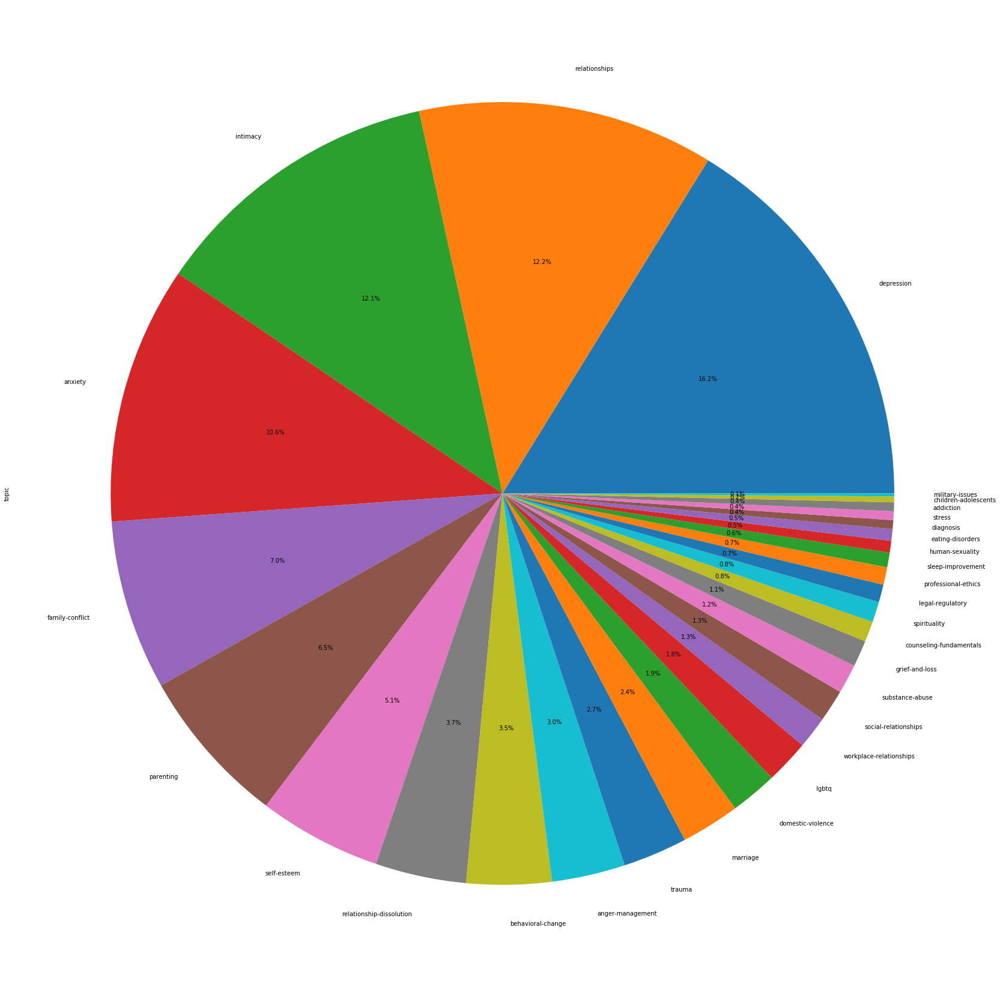

In [12]:
fig, ax = plt.subplots(1, 1, figsize=(30,30))
df['topic'].value_counts().plot.pie( autopct = '%1.1f%%')

In [13]:
df.topic.value_counts()

depression                  134
relationships               101
intimacy                    100
anxiety                     88 
family-conflict             58 
parenting                   54 
self-esteem                 42 
relationship-dissolution    31 
behavioral-change           29 
anger-management            25 
trauma                      22 
marriage                    20 
domestic-violence           16 
lgbtq                       15 
workplace-relationships     11 
social-relationships        11 
substance-abuse             10 
grief-and-loss              9  
counseling-fundamentals     7  
spirituality                7  
legal-regulatory            6  
professional-ethics         6  
sleep-improvement           5  
human-sexuality             4  
eating-disorders            4  
diagnosis                   3  
stress                      3  
addiction                   3  
children-adolescents        2  
military-issues             1  
Name: topic, dtype: int64

In [14]:
df[df.topic == "relationships"].sample(5)

,questionID,questionTitle,questionText,questionLink,topic,therapistInfo,therapistURL,answerText,upvotes,views,split
719,764,I feel like I could never be with anyone because no one would want me,What do I do if I have been feeling like I could never be with anyone because no one would want me. Or I couldn't have many friends because of who I am. It's strange I want to be loved but I'd hate to be because I always lose.,https://counselchat.com/questions/i-feel-like-i-could-never-be-with-anyone-because-no-one-would-want-me,relationships,Rebecca WongRelationship Therapist & Connectfulness Consultant,https://counselchat.com/therapists/rebecca-wong,"As a relationship therapist I work with a lot of people who feel similar feelings to some degree or another and almost always find that the origin of these feelings point back towards childhood. How did you caregivers express (or not express) love towards you? How did they express (or not express) love towards one another. These early messages become your template for how you have learned to see yourself and what you expect from others. In his book Wired for Love, Stan Tatkin, PsyD writes “We learn to love ourselves precisely because we have experienced being loved by someone. We learn to take care of ourselves because somebody has taken care of us. Our self worth and self-esteem also develop because of other people.” This could be very fruitful to explore in individual therapy with a relationship therapist who really gets it, you may have to interview a few to find the right fit; that's OK. Maybe you'd even want to read that book I linked above. :) Noticing this pattern is HUGE, it's where transformation begins. And now that you have be kind with yourself, it begins there too.",2,253,val
732,777,How do I start talking again after a fight?,I haven't uttered one word to my boyfriend in days. Now I'm over it and don't know how to approach the situation?,https://counselchat.com/questions/how-do-i-start-talking-again-after-a-fight,relationships,Jessica DobbsTherapist,https://counselchat.com/therapists/jessica-dobbs,"In any relationship, it is important to be able to say ""I'm sorry"" because it shows vulnerability and openness. I recommend that you sit and have a discussion with him now that you are calm about why you were upset and how you would like to handle such incidents in the future. If you find yourself becoming upset again, I encourage you to take a 20 minute break and then come back to the conversation once you are no longer heated. Studies show that talking or discussing arguments are more effective once you have cooled down and you are more likely to hear/understand what your partner is trying to convey.",3,206,train
644,687,"Should I wait for this guy to make a move, or just move on?",I told him I liked him. He called me lovely and pretty but he said he didn’t want a relationship. He would always flirt with me.,https://counselchat.com/questions/should-i-wait-for-this-guy-to-make-a-move-or-just-move-on,relationships,"Sherry Katz, LCSWCouples and Family Therapist, LCSW",https://counselchat.com/therapists/sherry-katz-lcsw,"Well, as disappointed as you may very well feel from hearing this guy's answer, you know he doesn't want a relationship.What type of move would you like him to make?If you mean you'd be happy to have sex with this guy and not a relationship, then wait for as long as your patience allows.To wait for him to change his mind that he does want a relationship, doesn't have a very strong base on which to stand.Its possible to do this only consider the emotional price of your frustration to wait for someone to change their mind.",0,68,train
725,770,My relationship feels off and I feel insecure,"My girlfriend's grandma passed away 5 months ago. They were very close. She took care of her till she died. Things kinda returned to normal few weeks later. Last month it feels like we hit a brick wall. Intimacy fell off. I asked what's up. She says she can't connect with anyone an

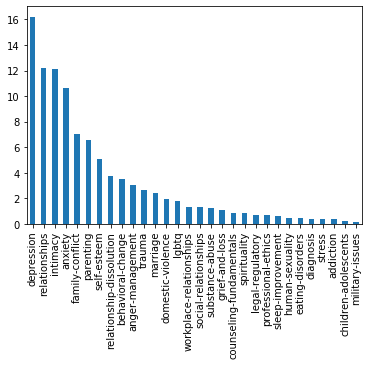

In [15]:
df.topic.value_counts(normalize=True).apply(lambda x:x*100).plot(kind='bar')


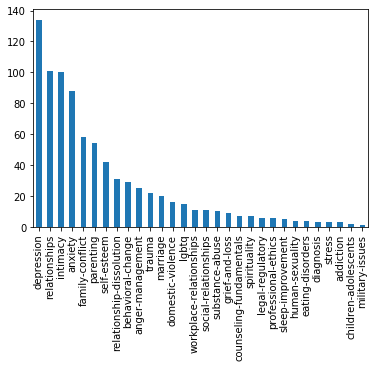

In [16]:
df.topic.value_counts().apply(lambda x:x).plot(kind='bar')

In [17]:
df.topic.value_counts(normalize=True).apply(lambda x:str(round(x*100,3))+" %")

depression                  16.203 %
relationships               12.213 %
intimacy                    12.092 %
anxiety                     10.641 %
family-conflict             7.013 % 
parenting                   6.53 %  
self-esteem                 5.079 % 
relationship-dissolution    3.748 % 
behavioral-change           3.507 % 
anger-management            3.023 % 
trauma                      2.66 %  
marriage                    2.418 % 
domestic-violence           1.935 % 
lgbtq                       1.814 % 
workplace-relationships     1.33 %  
social-relationships        1.33 %  
substance-abuse             1.209 % 
grief-and-loss              1.088 % 
counseling-fundamentals     0.846 % 
spirituality                0.846 % 
legal-regulatory            0.726 % 
professional-ethics         0.726 % 
sleep-improvement           0.605 % 
human-sexuality             0.484 % 
eating-disorders            0.484 % 
diagnosis                   0.363 % 
stress                      0.363 % 
a

In [18]:
#df = df[df.topic.isin(["depression","relationships","intimacy","anxiety"])]

In [106]:
df.head()

,questionID,questionTitle,questionText,questionLink,topic,therapistInfo,therapistURL,answerText,upvotes,views,split
0,0,Can I change my feeling of being worthless to everyone?,"I'm going through some things with my feelings and myself. I barely sleep and I do nothing but think about how I'm worthless and how I shouldn't be here.\n I've never tried or contemplated suicide. I've always wanted to fix my issues, but I never get around to it.\n How can I change my feeling of being worthless to everyone?",https://counselchat.com/questions/can-i-change-my-feeling-of-being-worthless-to-everyone,depression,"Sherry Katz, LCSWCouples and Family Therapist, LCSW",https://counselchat.com/therapists/sherry-katz-lcsw,"If everyone thinks you're worthless, then maybe you need to find new people to hang out with.Seriously, the social context in which a person lives is a big influence in self-esteem.Otherwise, you can go round and round trying to understand why you're not worthless, then go back to the same crowd and be knocked down again.There are many inspirational messages you can find in social media. Maybe read some of the ones which state that no person is worthless, and that everyone has a good purpose to their life.Also, since our culture is so saturated with the belief that if someone doesn't feel good about themselves that this is somehow terrible.Bad feelings are part of living. They are the motivation to remove ourselves from situations and relationships which do us more harm than good.Bad feelings do feel terrible. Your feeling of worthlessness may be good in the sense of motivating you to find out that you are much better than your feelings today.",1,2899,train
1,1,Do I have too many issues for counseling?,"I have so many issues to address. I have a history of sexual abuse, I’m a breast cancer survivor and I am a lifetime insomniac. I have a long history of depression and I’m beginning to have anxiety. I have low self esteem but I’ve been happily married for almost 35 years.\n I’ve never had counseling about any of this. Do I have too many issues to address in counseling?",https://counselchat.com/questions/do-i-have-too-many-issues-for-counseling,depression,"Noorayne ChevalierMA, RP, CCC, CCAC, LLP (Michigan)",https://counselchat.com/therapists/noorayne-chevalier,"Let me start by saying there are never too many concerns that you can bring into counselling. In fact, most people who come to see me for counselling have more than one issue they would like to work on in psychotherapy and most times these are all interconnected. In counselling, we work together, collaboratively, to figure out which issues you would like to address first and then together we develop an individualized plan of care. Basically, it’s like a road map of where you want to go, how are you going to get there, looking at stopovers, some scenic routes others possibly not so scenic, however, necessary. Of course, these plans can also change due to internal (what we have control over like our thoughts, feelings and behaviours) or external reasons (those things that are outside our control). I would encourage you to take the next step and reach out to a professional you can trust and build rapport with by co-journeying through whatever concerns you have by examining what has been working so far as you have learned to cope with some of your issues like insomnia, depression and anxiety, as well as being a breast cancer survivor. Then to help you by developing new coping strategies. Psychotherapy can be such a powerful tool to help you get to where it is you want to be. I know you can do it and you will see first-hand how psychotherapy will help you to move past these points in your life where you are feeling stuck. I like to quote Nike where their motto is, “just do it.” You can do it.",2,477,train
2,2,How do I find out the cause of my depression and anxiety?,"I have been feeling more and more down for over a month. I have started having trouble sleeping due to panic att

In [107]:
df = df.sort_values(by=['upvotes','views'], ascending=False)
df = df.reset_index()
df = df.drop("index", axis = 1)

In [108]:
df["topic"] = df["topic"].astype('category')

In [109]:
df["labels"] = df["topic"].cat.codes

In [110]:
df["text"] = df["questionText"]

In [111]:
df.head(10)

questionID  \
0  710          
1  709          
2  374          
3  42           
4  818          
5  134          
6  842          
7  596          
8  60           
9  141          

                                                                           questionTitle  \
0  How can I keep a long distance relationship going?                                      
1  How can I ask my boyfriend about who he's texting?                                      
2  Why do I feel like I'm always wrong in everything in my relationship?                   
3  Why do I feel sad all the time?                                                         
4  The Underlying Causes of Being Possessive                                               
5  I get depressed whenever anyone I care about is too busy to be with me. What do I do?   
6  Unethical Therapy Practices                                                             
7  How can I avoid family members who stress me out?                                       
8  My husband wants a divorce after I was diagnosed with severe depression                 
9  Thoughts of afterlife causes anxiety                                                    

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            questionText  \
0  We weren't long distance until he joined the military. I love him and I know he loves, me but it's complicated. He said he's not going to find someone else, but I'm afraid. How do I keep our relationship going?                                                                                                                                                                                                                                                                                                      
1  We've been in a long distance relationship for two and a half years. I recently saw his phone and saw the people he texts the most and one of them was a female coworker. I don't know how to approach this situation. How do I ask him about it?.                                                                                                                                                                                                                                                                      
2  My wife is always accusing me of cheating and telling me that I'm doing things she finds disrespectful even when I don't mean it like that. For example, she gets offended when I call someone at work "sweetheart." I wish I had a penny for every time she accused me of cheating on her. She doesn't, and never will say she was wrong. How do I get her to understand?                                                                                                                                              
3  I just feel sad all the time and I don't like anyone in my family. I feel like they're trying to control me and won't let me grow.                                                                                                                                                                                                                                                                                                                                                                                      
4  I am extremely possessive in my relationships and this is hurting my friendships. How can I fix my underlying issues?                                                                                                                                              

In [112]:
df.answerText = df.answerText.astype(str)
df.answerText = df.answerText.apply(lambda x: x.lower())

In [113]:
for i in range(df.shape[0]):
    if re.findall(r"([^.]*?(sounds like|seems like)[^.]*\.)",df.loc[i,"answerText"]):
        df.loc[i,"reflection"] = re.findall(r"([^.]*?(sounds like|seems like)[^.]*\.)",df.loc[i,"answerText"])[0][0] 
    elif len(df.loc[i,"answerText"].split(".")[0].split()) <= 3 and len(df.loc[i,"answerText"].split(".")) >= 2:
        df.loc[i,"reflection"] = df.loc[i,"answerText"].split(".")[1].strip()
    else:
        df.loc[i,"reflection"] = df.loc[i,"answerText"].split(".")[0].strip()

In [114]:
df["reflection"].sample(5)

590    there's two things this post relays - one, which i'm sure you've already looked into - is working with the school to address this problem                                                                                                                   
20     i understand that gender and/or sexual identity crises can be very difficult to navigate, although in today’s time i think we have made a lot of progress and it is becoming easier for individuals to find themselves and also find acceptance from society
766    i'm not sure whether you are referring to having a lot of activities after school or that homework is overwhelming                                                                                                                                          
14     oh my goodness, my heart goes out to you!!  i pray you have other strong and supportive loved ones or friends surrounding you                                                                                        

In [139]:
for i in range(df.shape[0]):
    if df.loc[i,"topic"] in ["relationships","intimacy","family-conflict","parenting","relationship-dissolution","marriage","domestic-violence"]:
        df.loc[i,"parent_topic"] = "family_conflicts"
    elif df.loc[i,"topic"] in ["depression","anxiety","stress","anger-management","trauma"]:
        df.loc[i,"parent_topic"] = "personal_emotional_conflicts"
    else:
        df.loc[i,"parent_topic"] = "others"


In [140]:
df.parent_topic.value_counts()

family_conflicts                380
personal_emotional_conflicts    272
others                          175
Name: parent_topic, dtype: int64

In [115]:
df.topic.value_counts()

depression                  134
relationships               101
intimacy                    100
anxiety                     88 
family-conflict             58 
parenting                   54 
self-esteem                 42 
relationship-dissolution    31 
behavioral-change           29 
anger-management            25 
trauma                      22 
marriage                    20 
domestic-violence           16 
lgbtq                       15 
social-relationships        11 
workplace-relationships     11 
substance-abuse             10 
grief-and-loss              9  
spirituality                7  
counseling-fundamentals     7  
legal-regulatory            6  
professional-ethics         6  
sleep-improvement           5  
eating-disorders            4  
human-sexuality             4  
diagnosis                   3  
stress                      3  
addiction                   3  
children-adolescents        2  
military-issues             1  
Name: topic, dtype: int64

In [116]:
df.dtypes

questionID       int64   
questionTitle    object  
questionText     object  
questionLink     object  
topic            category
therapistInfo    object  
therapistURL     object  
answerText       object  
upvotes          int64   
views            int64   
split            object  
labels           int8    
text             object  
reflection       object  
dtype: object

In [117]:
df.text = df.text.astype("str")

In [118]:
def initialize_tokenizer(pretrained_model):
    # Load pre-trained model tokenizer (vocabulary)
    tokenizer = BertTokenizer.from_pretrained(pretrained_model)
    return tokenizer

def get_index(tokenized_concept, tokenized_text):
    result=[]
    sll=len(tokenized_concept)
    for ind in (i for i,e in enumerate(tokenized_text) if e==tokenized_concept[0]):
        if tokenized_text[ind:ind+sll]==tokenized_concept:
            result = [ind,ind+sll-1]
    return result

In [119]:
pretrained_model = 'bert-base-uncased'
tokenizer = initialize_tokenizer(pretrained_model)
model = BertModel.from_pretrained(pretrained_model)
model.eval()

BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): BertLayerNorm()
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0): BertLayer(
        (attention): BertAttention(
          (self): BertSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): BertLayerNorm()
            (dropout): Dropout(p=0.1, inplace=False)
          )
        )
        (intermediate): BertIntermediate(
          (dense): Lin

In [121]:
user_question_context = "I am having a lot of trouble with my coworker. He keeps shouting at others. He dont do work."

user_question = "How to avoid a coworker and concentraye my work"

user_question_context = user_question + user_question_context

In [122]:
encoded_question_context = "[CLS] " + user_question_context + " [SEP]"

tokenized_encoded_question_context = tokenizer.tokenize(encoded_question_context)

indexed_encoded_question_context = tokenizer.convert_tokens_to_ids(tokenized_encoded_question_context)
segments_ids_encoded_question_context= [1] * len(tokenized_encoded_question_context)
tokens_tensor_encoded_question_context = torch.tensor([indexed_encoded_question_context])
segments_tensors_encoded_question_context = torch.tensor([segments_ids_encoded_question_context])

# Predict hidden states features for each layer
with torch.no_grad():
    encoded_layers_question_context, _ = model(tokens_tensor_encoded_question_context, segments_tensors_encoded_question_context)
token_vecs_question_context= encoded_layers_question_context[11][0]

question_vec = []

tokenized_question = tokenizer.tokenize(user_question)
indexes = get_index(tokenized_question, tokenized_encoded_question_context)

if len(indexes) == 0:
    print ("check if question title is present in the question context")
    sys.exit()

first_index, last_index = indexes[0], indexes[1] 
question_vec.append(torch.mean(token_vecs_question_context[first_index:last_index + 1], dim=0))
    

In [123]:
for i in range(df.shape[0]):
    try:
        
        encoded_answer_context = "[CLS] " + df.loc[i,"questionTitle"] + " " + df.loc[i,"questionText"] + " [SEP]"

        tokenized_encoded_answer_context = tokenizer.tokenize(encoded_answer_context)

        indexed_encoded_answer_context = tokenizer.convert_tokens_to_ids(tokenized_encoded_answer_context)
        segments_ids_encoded_answer_context= [1] * len(tokenized_encoded_answer_context)
        tokens_tensor_encoded_answer_context = torch.tensor([indexed_encoded_answer_context])
        segments_tensors_encoded_answer_context = torch.tensor([segments_ids_encoded_answer_context])

        # Predict hidden states features for each layer
        with torch.no_grad():
            encoded_layers_answer_context, _ = model(tokens_tensor_encoded_answer_context, segments_tensors_encoded_answer_context)
        token_vecs_answer_context= encoded_layers_answer_context[11][0]

        answer_vec = []

        tokenized_answer = tokenizer.tokenize(df.loc[i,"questionTitle"])
        indexes = get_index(tokenized_answer, tokenized_encoded_answer_context)

        if len(indexes) == 0:
            print ("check if question title is present in the question context")
            sys.exit()

        first_index, last_index = indexes[0], indexes[1] 
        answer_vec.append(torch.mean(token_vecs_answer_context[first_index:last_index + 1], dim=0))

        df.loc[i, "threshold"] = 1 - cosine(question_vec[0], answer_vec[0])
    except:
        print (i)
        df.loc[i,"threshold"] = -1


Token indices sequence length is longer than the specified maximum  sequence length for this BERT model (598 > 512). Running this sequence through BERT will result in indexing errors


294


Token indices sequence length is longer than the specified maximum  sequence length for this BERT model (675 > 512). Running this sequence through BERT will result in indexing errors


337


Token indices sequence length is longer than the specified maximum  sequence length for this BERT model (558 > 512). Running this sequence through BERT will result in indexing errors


350


Token indices sequence length is longer than the specified maximum  sequence length for this BERT model (525 > 512). Running this sequence through BERT will result in indexing errors


428


Token indices sequence length is longer than the specified maximum  sequence length for this BERT model (667 > 512). Running this sequence through BERT will result in indexing errors


581
777


In [124]:

df.sort_values(by=['threshold'], ascending=False)

,questionID,questionTitle,questionText,questionLink,topic,therapistInfo,therapistURL,answerText,upvotes,views,split,labels,text,reflection,threshold
816,371,How do I assert myself with a boss who called me co-dependent?,"My boss took over some work I'd begun. Concerned that she had doubts about my work, i asked her for feedback. I assured her that I did my utmost for customer service, and asked if I was deficient. She then said this was me being co-dependent.",https://counselchat.com/questions/how-do-i-assert-myself-with-a-boss-who-called-me-co-dependent,workplace-relationships,"Leonard PikaardWhen you're ready, help is here.",https://counselchat.com/therapists/leonard-pikaard,"this interaction with your boss seems strange. it is tricky to know how to handle workplace conflicts, but there are typically resources in place to help employees and mangers communicate successful and feel confident that they are being treated fairly at work. is there an hr department that you can use as a mediator?",0,11,train,29,"My boss took over some work I'd begun. Concerned that she had doubts about my work, i asked her for feedback. I assured her that I did my utmost for customer service, and asked if I was deficient. She then said this was me being co-dependent.",this interaction with your boss seems strange,0.767830
805,369,How do I get over a friend/coworker?,"I am conflicted with this guy I work with. He is a coworker and close friend whom I've had a crush on since meeting him four years ago. We made out once after years of flirting. I was hoping for more, but nothing happened. I distanced myself a lot after.",https://counselchat.com/questions/how-do-i-get-over-a-friend-coworker,workplace-relationships,Alexandra LarameeTherapy Practice for Professional Women,https://counselchat.com/therapists/alexandra-laramee,"hello! emotions run high in ""crush"" situations and when emotions run high it's not uncommon for us to have emotion-based instead of fact-based thoughts. after reading your question, i wondered how you went from ""making out"" to ""nothing happened?"" i wondered if this happened because of an emotion-based thought that sounded like ""if he liked me, he would make something happen."" a truer and more empowering thought might be ""i want something different to happen with him and i want to take a different action to see if that can happen."" this thought focuses more on the one thing you can control: you. hopefully, the thought also empowers you to think through what you can do to gauge interest/talk with him about his feelings on the matter. i hope this helps and good luck to you!",0,17,train,29,"I am conflicted with this guy I work with. He is a coworker and close friend whom I've had a crush on since meeting him four years ago. We made out once after years of flirting. I was hoping for more, but nothing happened. I distanced myself a lot after.","hello! emotions run high in ""crush"" situations and when emotions run high it's not uncommon for us to have emotion-based instead of fact-based thoughts",0.765190
799,874,How do I stop a bully who adults wouldn't recognize as bullying without speaking to the bully?,"She mostly targets me on social media. The bullying used to be much worse, but it is still going on. The comments are so vague, but I know that they are meant for me. Even when I confront her, she messages me short phrases to try to get in my head. If I try to fight back, she will ruin me.",https://counselchat.com/questions/how-do-i-stop-a-bully-who-adults-wouldn-t-recognize-as-bullying-without-speaking-to-the-bully,social-relationships,"Sherry Katz, LCSWCouples and Family Therapist, LCSW",https://counselchat.com/therapists/sherry-katz-lcsw,"sorry to hear of your problem situation. feeling intimidated by another person is very unsettling.stop having contact with the person.bullies only interact with others either by intimidating someone or by themselves feeling intimidated by someone.bullies do not have the same dynamics as ev

In [125]:
df[df.threshold == df.threshold.max()].reset_index().reflection[0]

'this interaction with your boss seems strange'

In [35]:
%pylab inline


import pandas as pd
import pickle as pk
from scipy import sparse as sp
from gensim.models import LdaModel
import json
from nltk.corpus import stopwords

Populating the interactive namespace from numpy and matplotlib


[nltk_data] Downloading package wordnet to /Users/kaushik-
[nltk_data]     shakkari/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [36]:
contraction_mapping = {"ain't": "is not", "aren't": "are not","can't": "cannot", 
                   "can't've": "cannot have", "'cause": "because", "could've": "could have", 
                   "couldn't": "could not", "couldn't've": "could not have","didn't": "did not", 
                   "doesn't": "does not", "don't": "do not", "hadn't": "had not", 
                   "hadn't've": "had not have", "hasn't": "has not", "haven't": "have not", 
                   "he'd": "he would", "he'd've": "he would have", "he'll": "he will", 
                   "he'll've": "he will have", "he's": "he is", "how'd": "how did", 
                   "how'd'y": "how do you", "how'll": "how will", "how's": "how is", 
                   "I'd": "I would", "I'd've": "I would have", "I'll": "I will", 
                   "I'll've": "I will have","I'm": "I am", "I've": "I have", 
                   "i'd": "i would", "i'd've": "i would have", "i'll": "i will", 
                   "i'll've": "i will have","i'm": "i am", "i've": "i have", 
                   "isn't": "is not", "it'd": "it would", "it'd've": "it would have", 
                   "it'll": "it will", "it'll've": "it will have","it's": "it is", 
                   "let's": "let us", "ma'am": "madam", "mayn't": "may not", 
                   "might've": "might have","mightn't": "might not","mightn't've": "might not have", 
                   "must've": "must have", "mustn't": "must not", "mustn't've": "must not have", 
                   "needn't": "need not", "needn't've": "need not have","o'clock": "of the clock", 
                   "oughtn't": "ought not", "oughtn't've": "ought not have", "shan't": "shall not",
                   "sha'n't": "shall not", "shan't've": "shall not have", "she'd": "she would", 
                   "she'd've": "she would have", "she'll": "she will", "she'll've": "she will have", 
                   "she's": "she is", "should've": "should have", "shouldn't": "should not", 
                   "shouldn't've": "should not have", "so've": "so have","so's": "so as", 
                   "this's": "this is",
                   "that'd": "that would", "that'd've": "that would have","that's": "that is", 
                   "there'd": "there would", "there'd've": "there would have","there's": "there is", 
                       "here's": "here is",
                   "they'd": "they would", "they'd've": "they would have", "they'll": "they will", 
                   "they'll've": "they will have", "they're": "they are", "they've": "they have", 
                   "to've": "to have", "wasn't": "was not", "we'd": "we would", 
                   "we'd've": "we would have", "we'll": "we will", "we'll've": "we will have", 
                   "we're": "we are", "we've": "we have", "weren't": "were not", 
                   "what'll": "what will", "what'll've": "what will have", "what're": "what are", 
                   "what's": "what is", "what've": "what have", "when's": "when is", 
                   "when've": "when have", "where'd": "where did", "where's": "where is", 
                   "where've": "where have", "who'll": "who will", "who'll've": "who will have", 
                   "who's": "who is", "who've": "who have", "why's": "why is", 
                   "why've": "why have", "will've": "will have", "won't": "will not", 
                   "won't've": "will not have", "would've": "would have", "wouldn't": "would not", 
                   "wouldn't've": "would not have", "y'all": "you all", "y'all'd": "you all would",
                   "y'all'd've": "you all would have","y'all're": "you all are","y'all've": "you all have",
                   "you'd": "you would", "you'd've": "you would have", "you'll": "you will", 
                   "you'll've": "you will have", "you're": "you are", "you've": "you have" } 

def spacy_cleaner(text):
    extra_space_handler = re.sub("\n", "", text)   #no empty line    
    apostrophe_handled = re.sub("’", "'", extra_space_handler)
    expanded = ' '.join([contraction_mapping[t] if t in contraction_mapping else t for t in apostrophe_handled.split(" ")])
    parsed = nlp(expanded)
    final_tokens = []
    for t in parsed:
        if t.is_punct or t.is_space or t.like_num or t.is_stop:
            pass
        else:
            if t.lemma_ == '-PRON-': # because spacy internally converts all pronouns to _PRON_ and we dont want that to happen in our processing
                final_tokens.append(str(t))
            else:
                sc_removed = re.sub("[^a-zA-Z]", '', str(t.lemma_))
                if len(sc_removed) > 1: #if there is a valid token then appended to final tokens
                    final_tokens.append(sc_removed)
    joined = ' '.join(final_tokens)
    #spell_corrected = re.sub(r'(.)\1+', r'\1\1', joined)  #Soooo goooood -> So good

    return joined.lower()

In [37]:
nlp = spacy.load('en')
docs = df[df.topic == "anxiety"]['text'].apply(lambda x:spacy_cleaner(x))

In [38]:
docs = [doc.split() for doc in docs]

In [39]:
docs

[['stop',
  'think',
  'life',
  'death',
  'raise',
  'religion',
  'teach',
  'live',
  'forever',
  'hell',
  'heaven',
  'think',
  'live',
  'forever',
  'heaven',
  'good',
  'feel',
  'overwhelmed',
  'like',
  'thought',
  'live',
  'forever',
  'thought',
  'mind',
  'thought',
  'lead',
  'panic',
  'anxiety',
  'crazy',
  'think',
  'thought',
  'normal'],
 ['anxiety', 'know', 'feel', 'like', 'scared', 'outcome'],
 ['think',
  'annoying',
  'bothersome',
  'girlfriend',
  'say',
  'fine',
  'think',
  'think',
  'stress'],
 ['head',
  'injury',
  'year',
  'ago',
  'mind',
  'race',
  'time',
  'trouble',
  'sleep',
  'lot',
  'anxiety',
  'medicine',
  'body',
  'reject',
  'sick',
  'stomach',
  'blister',
  'mouth',
  'calm',
  'self',
  'wreck'],
 ['start',
  'counsel',
  'therapy',
  'day',
  'freak',
  'main',
  'fear',
  'cry',
  'embarrass',
  'worry'],
 ['feel',
  'insecure',
  'life',
  'think',
  'wife',
  'truly',
  'want',
  'relationship',
  'say',
  'turn',
  

In [40]:
docs = [[token for token in doc if not token.isdigit() and token not in stopwords.words('english')] for doc in docs]

In [41]:
from gensim.corpora import Dictionary

dictionary = Dictionary(docs)
print('Number of unique words in initital documents:', len(dictionary))

dictionary.filter_extremes(no_below=10, no_above=0.2)
print('Number of unique words after removing rare and common words:', len(dictionary))

Number of unique words in initital documents: 639
Number of unique words after removing rare and common words: 10


In [42]:
corpus = [dictionary.doc2bow(doc) for doc in docs]

In [43]:
print('Number of unique tokens: %d' % len(dictionary))
print('Number of documents: %d' % len(corpus))

Number of unique tokens: 10
Number of documents: 88


In [44]:
# Set training parameters.
num_topics = 5
chunksize = 500 # size of the doc looked at every pass
passes = 20 # number of passes through documents
iterations = 400
eval_every = 1  # Don't evaluate model perplexity, takes too much time.

# Make a index to word dictionary.
temp = dictionary[0]  # This is only to "load" the dictionary.
id2word = dictionary.id2token

%time model = LdaModel(corpus=corpus, id2word=id2word, chunksize=chunksize, \
                       alpha='auto', eta='auto', \
                       iterations=iterations, num_topics=num_topics, \
                       passes=passes, eval_every=eval_every)

CPU times: user 1.72 s, sys: 23.9 ms, total: 1.74 s
Wall time: 2.33 s


In [45]:
import pyLDAvis.gensim
pyLDAvis.enable_notebook()

warnings.filterwarnings("ignore", category=DeprecationWarning)

In [46]:
pyLDAvis.gensim.prepare(model, corpus, dictionary)

/Users/kaushik-shakkari/anaconda3/lib/python3.7/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.216142  0.058750  1       1        29.912519
1     -0.280232 -0.172867  2       1        25.509846
3      0.216117 -0.164785  3       1        19.931702
2     -0.100606  0.227446  4       1        15.469246
4     -0.051421  0.051456  5       1        9.176685 , topic_info=  Category       Freq    Term      Total  loglift  logprob
4  Default  18.000000  year    18.000000  10.0000  10.0000
2  Default  10.000000  scared  10.000000  9.0000   9.0000 
9  Default  11.000000  attack  11.000000  8.0000   8.0000 
8  Default  16.000000  go      16.000000  7.0000   7.0000 
7  Default  13.000000  talk    13.000000  6.0000   6.0000 
6  Default  11.000000  make    11.000000  5.0000   5.0000 
0  Default  11.000000  panic   11.000000  4.0000   4.0000 
5  Default  11.000000  help    11.000000  3.0000   3.0000 
3  Default  16.000000  lot     16.000000  2.0000   2.0000 
1  Default  11.000000  stop    11.000000  1.0000   1.0000 
8  Topic1   15.784315  go      16.514381  1.1617  -0.9244 
3  Topic1   11.036093  lot     16.223045  0.8216  -1.2823 
1  Topic1   6.985384   stop    11.514044  0.7071  -1.7396 
0  Topic1   4.489498   panic   11.617749  0.2561  -2.1817 
5  Topic1   0.270148   help    11.309925 -2.5276  -4.9922 
2  Topic1   0.233963   scared  10.842665 -2.6292  -5.1360 
9  Topic1   0.251617   attack  11.959762 -2.6545  -5.0633 
6  Topic1   0.221238   make    11.099090 -2.7085  -5.1920 
7  Topic1   0.227088   talk    13.745879 -2.8963  -5.1659 
4  Topic1   0.284307   year    18.173460 -2.9508  -4.9412 
7  Topic2   12.951338  talk    13.745879  1.3066  -0.9630 
6  Topic2   9.944469   make    11.099090  1.2563  -1.2272 
5  Topic2   8.488638   help    11.309925  1.0792  -1.3855 
2  Topic2   0.827464   scared  10.842665 -1.2068  -3.7136 
0  Topic2   0.354785   panic   11.617749 -2.1227  -4.5605 
1  Topic2   0.338670   stop    11.514044 -2.1602  -4.6070 
3  Topic2   0.348478   lot     16.223045 -2.4745  -4.5784 
9  Topic2   0.222581   attack  11.959762 -2.6179  -5.0267 
4  Topic2   0.257688   year    18.173460 -2.8899  -4.8802 
8  Topic2   0.193985   go      16.514381 -3.0781  -5.1642 
4  Topic3   17.073065  year    18.173460  1.5504  -0.4400 
1  Topic3   3.451756   stop    11.514044  0.4082  -2.0386 
3  Topic3   4.034404   lot     16.223045  0.2213  -1.8826 
6  Topic3   0.517534   make    11.099090 -1.4527  -3.9362 
0  Topic3   0.336781   panic   11.617749 -1.9280  -4.3658 
5  Topic3   0.283549   help    11.309925 -2.0732  -4.5379 
2  Topic3   0.227597   scared  10.842665 -2.2508  -4.7577 
9  Topic3   0.217720   attack  11.959762 -2.3932  -4.8020 
7  Topic3   0.188761   talk    13.745879 -2.6752  -4.9448 
8  Topic3   0.177998   go      16.514381 -2.9174  -5.0035 
9  Topic4   10.886587  attack  11.959762  1.7723  -0.6365 
0  Topic4   5.881704   panic   11.617749  1.1856  -1.2522 
5  Topic4   2.018836   help    11.309925  0.1432  -2.3215 
1  Topic4   0.310774   stop    11.514044 -1.7459  -4.1927 
3  Topic4   0.381714   lot     16.223045 -1.8832  -3.9871 
2  Topic4   0.235955   scared  10.842665 -1.9613  -4.4681 
6  Topic4   0.208127   make    11.099090 -2.1102  -4.5936 
4  Topic4   0.276321   year    18.173460 -2.3198  -4.3102 
7  Topic4   0.188082   talk    13.745879 -2.4253  -4.6949 
8  Topic4   0.185995   go      16.514381 -2.6199  -4.7061 
2  Topic5   9.317685   scared  10.842665  2.2369  -0.2699 
0  Topic5   0.554981   panic   11.617749 -0.6529  -3.0907 
1  Topic5   0.427459   stop    11.514044 -0.9050  -3.3517 
9  Topic5   0.381255   attack  11.959762 -1.0573  -3.4661 
3  Topic5   0.422357   lot     16.223045 -1.2598  -3.3637 
5  Topic5   0.248755   help    11.309925 -1.4285  -3.8931 
6  Topic5   0.207721   make    11.099090 -1.5899  -4.0734 
4  Topic5   0.282078   year    18.173460 -1.7770  -3.7674 
7  Topic5   0.190610   talk    13.745879 -1.8898  -4.1594 
8  Topic5   0.172089   go      16.51438